# Assignment on explorative data analysis

Dear students,

this introductory course to machine learning has not started yet. However, an industry partner just provided us with a real data set and is now quite eager to hear whether machine learning applied to this data can open up new opportunities or improve their current business. We therefore ask you to conduct an explorative data analysis and to elaborate on how machine learning could bring our partner to a next level. We award points for non-trivial insights that emerge from your data analysis as well as for reasonable advises to our industry partner. Try your best even when you feel like being thrown in at the deep end.

## Schifffahrtsgesellschaft Vierwaldstättersee 

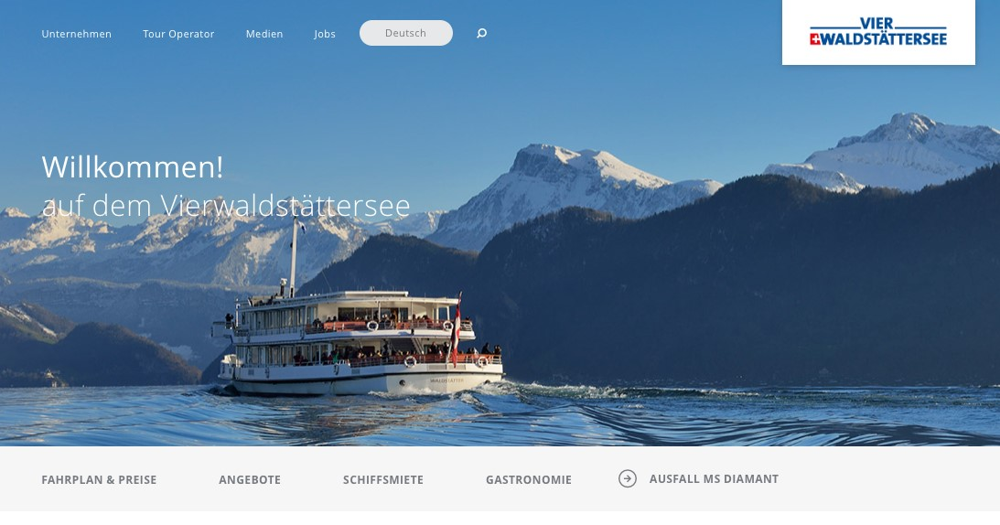

We are given a data set containing the number of passengers per day along with a lot more information. Conduct an explorative analysis, uncover interesting and non-trivial insights and speculate on how your insights would boost our partner’s business.

### Imports

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()

### Load the data
> Load the dataset `sgv.csv` as a pandas dataframe. *Hint: You have to use the argument `sep`*

In [11]:
# Load the dataset
df = pd.read_csv('sgv.csv', sep=';')

In [12]:
df = pd.read_csv("sgv.csv", sep=";")

> Verify that the data has 18 columns.

In [13]:
# Verify the shape
df.shape

(3652, 18)

In [14]:
df.shape

(3652, 18)

> Display the first 5 rows.

In [15]:
# Display the first 5 rows
df[0:5]

,Passengers,Revision,Temperature_Midday,Sunshine_Percentage,Snow_5Days,Temperature_Deviation,Temperature_Max,Temperature_Min,Temperature_Evening,Precipiation_5Days,Precipiation,Wind,Holiday,Special_Event,Year,Day_in_Month,Day,Month
0,2580,0,4.9,52.0,5.0,2.3,5.1,-0.8,0.9,12.1,4.6,9.9,1,1,2006,1,Sunday,January
1,1973,0,2.4,0.0,5.0,2.3,3.4,0.6,2.7,12.4,0.3,6.1,1,1,2006,2,Monday,January
2,1044,0,2.2,11.0,5.0,1.6,2.9,-1.6,1.8,12.4,0.0,5.3,0,0,2006,3,Tuesday,January
3,980,0,0.8,0.0,0.0,0.2,1.1,-1.0,0.6,10.3,0.0,6.4,0,0,2006,4,Wednesday,January
4,1139,0,-0.3,88.0,0.0,-1.8,0.9,-5.4,-3.2,0.3,0.0,4.5,0,0,2006,5,Thursday,January


In [16]:
df.head(n=5)

,Passengers,Revision,Temperature_Midday,Sunshine_Percentage,Snow_5Days,Temperature_Deviation,Temperature_Max,Temperature_Min,Temperature_Evening,Precipiation_5Days,Precipiation,Wind,Holiday,Special_Event,Year,Day_in_Month,Day,Month
0,2580,0,4.9,52.0,5.0,2.3,5.1,-0.8,0.9,12.1,4.6,9.9,1,1,2006,1,Sunday,January
1,1973,0,2.4,0.0,5.0,2.3,3.4,0.6,2.7,12.4,0.3,6.1,1,1,2006,2,Monday,January
2,1044,0,2.2,11.0,5.0,1.6,2.9,-1.6,1.8,12.4,0.0,5.3,0,0,2006,3,Tuesday,January
3,980,0,0.8,0.0,0.0,0.2,1.1,-1.0,0.6,10.3,0.0,6.4,0,0,2006,4,Wednesday,January
4,1139,0,-0.3,88.0,0.0,-1.8,0.9,-5.4,-3.2,0.3,0.0,4.5,0,0,2006,5,Thursday,January


It looks like the date is defined in 3 separate columns. Let's merge them together

In [17]:
df['Date'] = df['Month'].astype(str) + '-' + df['Day_in_Month'].astype(str) + '-' + df['Year'].astype(str)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df.head()

,Passengers,Revision,Temperature_Midday,Sunshine_Percentage,Snow_5Days,Temperature_Deviation,Temperature_Max,Temperature_Min,Temperature_Evening,Precipiation_5Days,Precipiation,Wind,Holiday,Special_Event,Year,Day_in_Month,Day,Month,Date
0,2580,0,4.9,52.0,5.0,2.3,5.1,-0.8,0.9,12.1,4.6,9.9,1,1,2006,1,Sunday,January,2006-01-01
1,1973,0,2.4,0.0,5.0,2.3,3.4,0.6,2.7,12.4,0.3,6.1,1,1,2006,2,Monday,January,2006-01-02
2,1044,0,2.2,11.0,5.0,1.6,2.9,-1.6,1.8,12.4,0.0,5.3,0,0,2006,3,Tuesday,January,2006-01-03
3,980,0,0.8,0.0,0.0,0.2,1.1,-1.0,0.6,10.3,0.0,6.4,0,0,2006,4,Wednesday,January,2006-01-04
4,1139,0,-0.3,88.0,0.0,-1.8,0.9,-5.4,-3.2,0.3,0.0,4.5,0,0,2006,5,Thursday,January,2006-01-05


### Handle datatypes

It's always a good idea to take a look at the data types. 

>Print the datatype of each column.

In [18]:
# Print the datatype of each column.
df.dtypes

Passengers                        int64
Revision                          int64
Temperature_Midday              float64
Sunshine_Percentage             float64
Snow_5Days                      float64
Temperature_Deviation           float64
Temperature_Max                 float64
Temperature_Min                 float64
Temperature_Evening             float64
Precipiation_5Days              float64
Precipiation                    float64
Wind                            float64
Holiday                           int64
Special_Event                     int64
Year                              int64
Day_in_Month                      int64
Day                              object
Month                            object
Date                     datetime64[ns]
dtype: object

In [19]:
df.dtypes

Passengers                        int64
Revision                          int64
Temperature_Midday              float64
Sunshine_Percentage             float64
Snow_5Days                      float64
Temperature_Deviation           float64
Temperature_Max                 float64
Temperature_Min                 float64
Temperature_Evening             float64
Precipiation_5Days              float64
Precipiation                    float64
Wind                            float64
Holiday                           int64
Special_Event                     int64
Year                              int64
Day_in_Month                      int64
Day                              object
Month                            object
Date                     datetime64[ns]
dtype: object

The columns *Month* and *Day* are categorical and nominal. 

> Encode them as pandas datatype `categorical` (you can use [pd.DataFrame.astype()](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.astype.html)) and print the dtypes afterwards.

In [20]:
# Encode them as pandas datatype categorical
df['Day'] = df['Day'].astype('category')
df['Month'] = df['Month'].astype('category')
df.dtypes

Passengers                        int64
Revision                          int64
Temperature_Midday              float64
Sunshine_Percentage             float64
Snow_5Days                      float64
Temperature_Deviation           float64
Temperature_Max                 float64
Temperature_Min                 float64
Temperature_Evening             float64
Precipiation_5Days              float64
Precipiation                    float64
Wind                            float64
Holiday                           int64
Special_Event                     int64
Year                              int64
Day_in_Month                      int64
Day                            category
Month                          category
Date                     datetime64[ns]
dtype: object

In [21]:
df.Month = df.Month.astype('category')
df.Day = df.Day.astype('category')
df.dtypes

Passengers                        int64
Revision                          int64
Temperature_Midday              float64
Sunshine_Percentage             float64
Snow_5Days                      float64
Temperature_Deviation           float64
Temperature_Max                 float64
Temperature_Min                 float64
Temperature_Evening             float64
Precipiation_5Days              float64
Precipiation                    float64
Wind                            float64
Holiday                           int64
Special_Event                     int64
Year                              int64
Day_in_Month                      int64
Day                            category
Month                          category
Date                     datetime64[ns]
dtype: object

### Check for duplicates
Let's begin by checking for duplicate rows. With the data at hand, exact duplicates should not occur. Exact duplicates thus hint at an anomaly from entering, processing or extracting the data (which is in fact very common).

> Find out if there are rows that are exact duplicates. If there are, examine and possibly drop them. You can use [pd.DataFrame.duplicated()](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.duplicated.html) and [pd.DataFrame.drop_duplicates()](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.drop_duplicates.html).

In [22]:
# check if they are any
df.duplicated().any()

False

In [23]:
# if there are, print them...

In [24]:
# ... and drop them

In [25]:
# check if they are any
df.duplicated().any()

False

There are no duplicates in our dataset. If there would be any, we could display and drop them with the following commands:

In [53]:
# if there would be duplicates, we could display them with the following command:
df[df.duplicated(keep=False)].head(n=10)

,Passengers,Revision,Temperature_Midday,Sunshine_Percentage,Snow_5Days,Temperature_Deviation,Temperature_Max,Temperature_Min,Temperature_Evening,Precipiation_5Days,Precipiation,Wind,Holiday,Special_Event,Year,Day_in_Month,Day,Month,Date


In [54]:
# The duplicates could be dropped by using the following command:
df.drop_duplicates(inplace=True)

### Null Values
> Check if there are any null values in this dataset and replace them with the mean.

In [26]:
# Check if there are any null values
df.isna().any()

Passengers               False
Revision                 False
Temperature_Midday       False
Sunshine_Percentage      False
Snow_5Days                True
Temperature_Deviation    False
Temperature_Max          False
Temperature_Min          False
Temperature_Evening      False
Precipiation_5Days       False
Precipiation              True
Wind                      True
Holiday                  False
Special_Event            False
Year                     False
Day_in_Month             False
Day                      False
Month                    False
Date                     False
dtype: bool

In [27]:
# ... and replace them with the mean.
df = df.fillna(df.mean())
df.isna().any().any

<ipython-input-27-f10924149d38>:2: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  df = df.fillna(df.mean())


<bound method Series.any of Passengers               False
Revision                 False
Temperature_Midday       False
Sunshine_Percentage      False
Snow_5Days               False
Temperature_Deviation    False
Temperature_Max          False
Temperature_Min          False
Temperature_Evening      False
Precipiation_5Days       False
Precipiation             False
Wind                     False
Holiday                  False
Special_Event            False
Year                     False
Day_in_Month             False
Day                      False
Month                    False
Date                     False
dtype: bool>

In [ ]:
df.isna().any() # add another .any() to aggregate to a single Boolean

* It appears that the columns 'wind' and 'snow' have some null values. We replace them with the mean.

In [ ]:
df = df.fillna(df.mean())

### Data ranges

> Check the data ranges by examing the minimum and maximum value of each column. Comment your findings and fix the errors.
You can use the [pd.DataFrame.describe()](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.describe.html#pandas.DataFrame.describe) method.

In [57]:
# examine the minimum and maximum values
df.describe()

,Passengers,Revision,Temperature_Midday,Sunshine_Percentage,Snow_5Days,Temperature_Deviation,Temperature_Max,Temperature_Min,Temperature_Evening,Precipiation_5Days,Precipiation,Wind,Holiday,Special_Event,Year,Day_in_Month
count,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000
mean,6387.802300,0.009584,12.849425,37.032161,0.788468,1.153313,14.617716,6.212568,11.556039,16.773439,3.347513,8.016350,0.042442,0.041073,2010.499726,15.727820
std,6033.488385,0.097440,8.509759,34.982702,3.107446,3.352714,8.801185,6.729164,8.341950,19.071723,7.159809,4.647082,0.221064,0.198487,2.872293,8.800529
min,0.000000,0.000000,-11.200000,0.000000,0.000000,-12.000000,-9.300000,-16.100000,-10.700000,0.000000,0.000000,2.200000,0.000000,0.000000,2006.000000,1.000000
25%,1547.000000,0.000000,6.000000,1.750000,0.000000,-1.100000,7.500000,0.600000,4.600000,1.700000,0.000000,4.900000,0.000000,0.000000,2008.000000,8.000000
50%,4029.000000,0.000000,13.300000,28.000000,0.000000,1.300000,15.100000,6.400000,11.900000,10.500000,0.000000,6.400000,0.000000,0.000000,2010.500000,16.000000
75%,9771.000000,0.000000,19.500000,68.000000,0.000000,3.500000,21.500000,11.800000,18.100000,24.900000,3.125000,9.725000,0.000000,0.000000,2013.000000,23.000000
max,34878.000000,1.000000,32.700000,101.000000,36.000000,14.600000,34.900000,21.500000,32.700000,113.700000,70.200000,31.100000,6.000000,1.000000,2015.000000,31.000000


In [58]:
# fix the errors
# sunshine percentage is higher than 100
df['Sunshine_Percentage'].values[df['Sunshine_Percentage'] > 100] = 100
df.describe()

,Passengers,Revision,Temperature_Midday,Sunshine_Percentage,Snow_5Days,Temperature_Deviation,Temperature_Max,Temperature_Min,Temperature_Evening,Precipiation_5Days,Precipiation,Wind,Holiday,Special_Event,Year,Day_in_Month
count,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000
mean,6387.802300,0.009584,12.849425,37.031613,0.788468,1.153313,14.617716,6.212568,11.556039,16.773439,3.347513,8.016350,0.042442,0.041073,2010.499726,15.727820
std,6033.488385,0.097440,8.509759,34.981708,3.107446,3.352714,8.801185,6.729164,8.341950,19.071723,7.159809,4.647082,0.221064,0.198487,2.872293,8.800529
min,0.000000,0.000000,-11.200000,0.000000,0.000000,-12.000000,-9.300000,-16.100000,-10.700000,0.000000,0.000000,2.200000,0.000000,0.000000,2006.000000,1.000000
25%,1547.000000,0.000000,6.000000,1.750000,0.000000,-1.100000,7.500000,0.600000,4.600000,1.700000,0.000000,4.900000,0.000000,0.000000,2008.000000,8.000000
50%,4029.000000,0.000000,13.300000,28.000000,0.000000,1.300000,15.100000,6.400000,11.900000,10.500000,0.000000,6.400000,0.000000,0.000000,2010.500000,16.000000
75%,9771.000000,0.000000,19.500000,68.000000,0.000000,3.500000,21.500000,11.800000,18.100000,24.900000,3.125000,9.725000,0.000000,0.000000,2013.000000,23.000000
max,34878.000000,1.000000,32.700000,100.000000,36.000000,14.600000,34.900000,21.500000,32.700000,113.700000,70.200000,31.100000,6.000000,1.000000,2015.000000,31.000000


In [ ]:
df.describe()

It appears that the maximum value of sunshine is **101%**. You can easily fix this by using the following command:

In [ ]:
df["Sunshine_Percentage"].values[df["Sunshine_Percentage"] > 100] = 100

### Plot the data
To get a better understanding we often plot the data.

> Plot the number of passengers over time and try to interpret the data.

<AxesSubplot:xlabel='Date'>

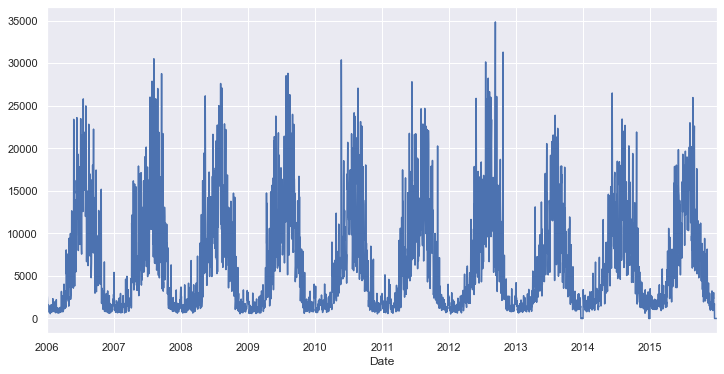

In [71]:
# Plot the number of passengers over time and try to interpret the data
df_time_index = df.set_index('Date')
plt.subplots(figsize=(12,6))
df_time_index['Passengers'].plot()

# it is evident that the passenger numbers reach their max in the middle of the year, 
# most probably due to the nice weather conditions

<AxesSubplot:title={'center':'Passengers over time'}>

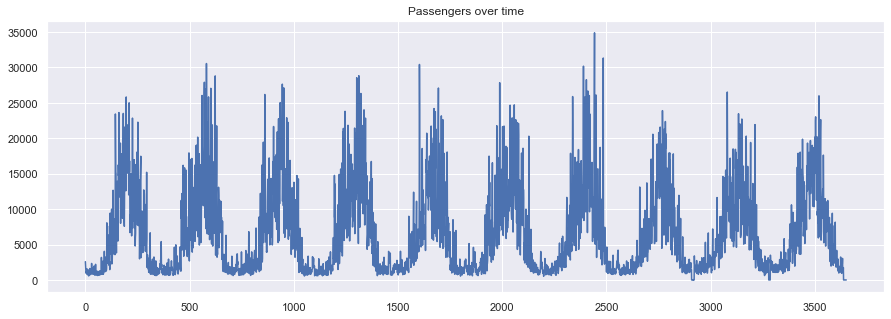

In [62]:
fig, ax = plt.subplots(figsize=(15,5))
df.Passengers.plot(title="Passengers over time", ax=ax)

Here we see some periodic patterns which may be related to seasonal effects (winter and summer). At this stage, we perform a data analysis for a better understanding of the effects and identify possible outliers.

### Correlation analysis
> Implement a correlation analysis for the given dataset. Comment your findings.

<AxesSubplot:>

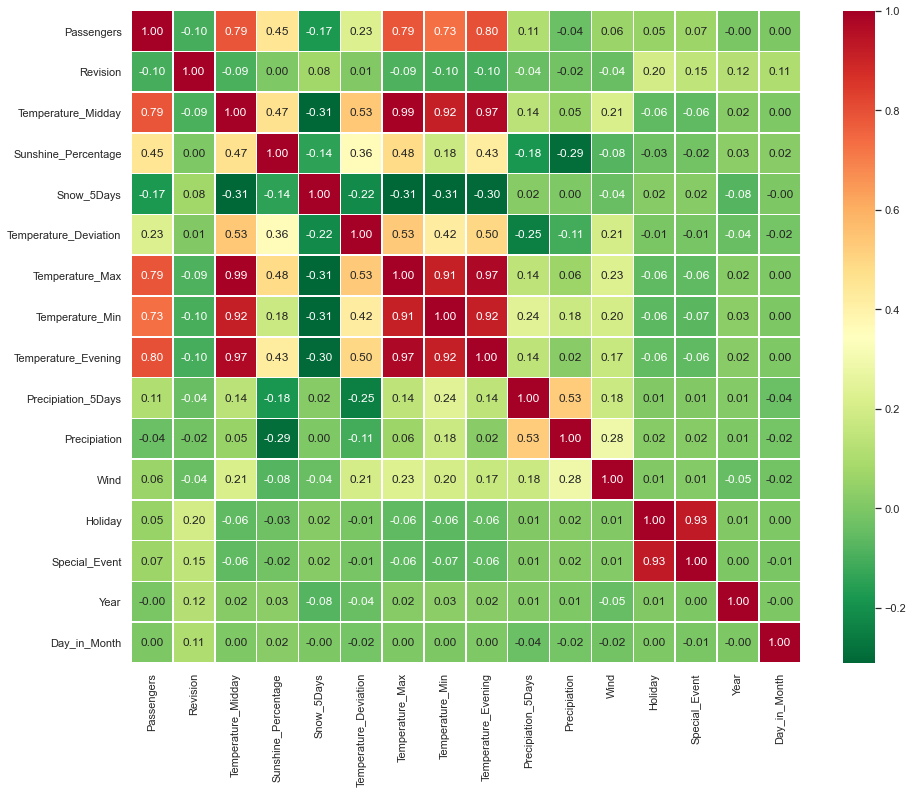

In [74]:
# Plot correlations
plt.subplots(figsize=(15,12))
sns.heatmap(df.corr(), annot = True, cmap='RdYlGn_r', linewidths = 0.5, fmt='.2f')

# Passengers and Temperature are positively correlated. The higher the temperature, the more passengers.
# The temperatur in the evening has the strongest correlation (probably because people are more likely
# to work during the day). Something that is also strongly positively correlated is Holiday and Special Event. 
# So it seems that special events take place on holidays. Other logical correlations such as snow and low temperture
# are also visible

In [ ]:
plt.subplots(figsize=(12, 12))
sns.heatmap(df.corr(), annot=True, cmap='RdYlGn_r', linewidths=0.5, fmt='.2f')

In the correlation matrix above we can see some correlation
* The temperature correlates highly with the number of passengers
* The percentage of sunshine correlates with the number of passengers

### Outliers
Let's take a look at outliers. A boxplot is a very useful graphical representation of a five number summary together with potential outliers. Outliers are displayed as small circles above or below the boxplot.

We create a boxplot for every numerical value.

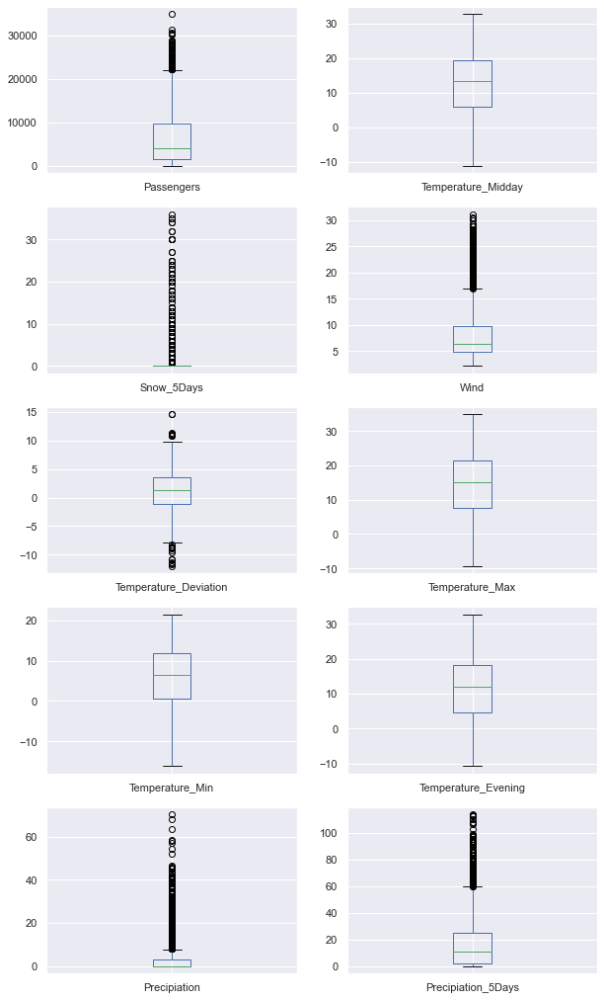

In [75]:
numerical_cols = ['Passengers', 'Temperature_Midday', 'Snow_5Days', 'Wind', 'Temperature_Deviation',
                  'Temperature_Max', 'Temperature_Min', 'Temperature_Evening', 'Precipiation', 'Precipiation_5Days']
_ = df.loc[:, numerical_cols].plot(kind='box', subplots=True, layout=(5, 2), figsize=(10, 18), sharex=False)

According to the rule that values at least $1.5 \cdot \text{IQR}$ above the 3rd quartile or below the 1st quartile are considered as outliers, we have many of those (the circles in the boxplot). However, as we already have checked the validity of the data ranges, we assume that these are in fact valid, but extreme samples.

## Sanity check
It often makes sense to manually check the dataset for logical issues. In our case we could check if there were any passengers when there was a revision or if there was snow at unexpected times.

### Amount of passengers during revisions
During revisions no ships are in use. Therefore, the amount of passengers during this period is expected to be zero. 
> Check if this is the case and fix the error.

In [78]:
# Get number of passengers during revision
df[(df.Revision == 1) & (df.Passengers > 0)].head()

,Passengers,Revision,Temperature_Midday,Sunshine_Percentage,Snow_5Days,Temperature_Deviation,Temperature_Max,Temperature_Min,Temperature_Evening,Precipiation_5Days,Precipiation,Wind,Holiday,Special_Event,Year,Day_in_Month,Day,Month,Date


In [ ]:
df[(df.Revision == 1) & (df.Passengers > 0)].head()

In [79]:
# Fix the error
df.Passengers.values[df.Revision==1] = 0

In [ ]:
df.Passengers.values[df.Revision==1] = 0

### Compare min/max temperature

For each day, there is a minumum and maximum temperature recorded. 
> Check if the minimum temperature is smaller than the maximum temperature.

In [80]:
# Compare min/max temperature
(df["Temperature_Min"] < df["Temperature_Max"]).all()

True

In [ ]:
(df["Temperature_Min"] < df["Temperature_Max"]).all()

### Take a closer look to the snow distribution over the months

Lets convert our dataset into a matrix where we can see the average amount of snow for each month per year.

In [81]:
pd.pivot_table(df, index=[df.Date.dt.month, "Month"], columns=["Year"], values=["Snow_5Days"])

Snow_5Days                                                    \
Year                 2006      2007      2008      2009      2010      2011   
Date Month                                                                    
1    January     1.451613  2.258065  0.788468  1.960918  6.354839  1.774194   
2    February    1.285714  0.000000  0.788468  6.250000  4.928571  0.000000   
3    March       6.741935  1.960918  0.788468  0.000000  0.806452  0.000000   
4    April       0.333333  0.788468  0.788468  0.000000  0.000000  0.000000   
5    May         0.000000  0.788468  0.788468  0.000000  0.000000  0.000000   
6    June        0.000000  0.788468  0.788468  0.000000  0.000000  0.000000   
7    July        0.000000  0.788468  0.788468  0.000000  0.000000  0.000000   
8    August      0.000000  0.788468  0.788468  0.000000  0.000000  0.000000   
9    September   0.000000  0.788468  0.788468  0.000000  0.000000  0.000000   
10   October     0.000000  0.788468  1.237594  0.000000  0.000000  0.000000   
11   November    0.000000  0.788468  1.633333  0.266667  0.433333  0.026282   
12   December    0.000000  0.788468  5.161290  3.129032  6.516129  1.230770   

                                                        
Year                2012      2013      2014      2015  
Date Month                                              
1    January    0.451613  1.290323  0.000000  3.354839  
2    February   1.241379  5.714286  0.000000  0.000000  
3    March      0.000000  1.290323  0.000000  0.000000  
4    April      0.000000  0.333333  0.000000  0.000000  
5    May        0.000000  0.000000  0.000000  0.000000  
6    June       0.000000  0.000000  0.000000  0.000000  
7    July       0.000000  0.000000  0.000000  0.000000  
8    August     0.000000  0.000000  0.000000  0.000000  
9    September  0.000000  0.000000  0.000000  0.000000  
10   October    0.000000  0.000000  0.000000  0.000000  
11   November   0.152565  0.000000  0.000000  0.000000  
12   December   7.714641  0.000000  3.580645  0.000000

Take a look at the table above. Comment your findings and try to explain how these anomalies could have occured.

> Findings:

In [ ]:
# The average amounts of snow seem to be logical. Except in the year 2008. It could be that there was an error 
# while measuring, because according to the numbers, the same amount of snow was present from January to September. 
# Thats not true and can't be right.

* There was snow during the summer in 2007 and 2008
* The amount of snow remained constant from april 2007 till september 2008

Now we want to clean these errors. 
> Set the amount of snow for months june, july, august, september and october to zero.

In [82]:
# Set the amount of snow for months june, july, august, september and october to zero
df.Snow_5Days.values[df.Month.isin(["June", "July", "August", "September", "October"])] = 0

In [ ]:
df.Snow_5Days.values[df.Month.isin(["June", "July", "August", "September", "October"])] = 0

## Automatic Data Quality Assessment
[Pandas Profiling](https://github.com/pandas-profiling/pandas-profiling) is pretty neat python package which allows us to automatically generate a profile report for a data frame. Let's try it out on our dataset and check whether it recognizes that there were some missing snow records.

*Note*: You might run into issues with some browsers. We recommend you to use the Chrome Browser. Alterantively you can save the report as html.

In [83]:
import pandas_profiling
df2 = pd.read_csv("sgv.csv", sep=";")
profile = df2.profile_report()
# Save report
profile.to_file(output_file="sgv-profile.html")
profile

## Assignment
Now it's your turn. Open the ILIAS quiz **Data Quality Assessment** and answer the questions.

> Use these cells to answer the questions

## Snow during summer months

In [7]:
# Snow during summer months
df3 = pd.read_csv("sgv.csv", sep=";")

# check if there are null values in snow-column
df3['Snow_5Days'].isna().any()

True

In [8]:
df3.describe()

,Passengers,Revision,Temperature_Midday,Sunshine_Percentage,Snow_5Days,Temperature_Deviation,Temperature_Max,Temperature_Min,Temperature_Evening,Precipiation_5Days,Precipiation,Wind,Holiday,Special_Event,Year,Day_in_Month
count,3652.000000,3652.000000,3652.000000,3652.000000,3087.000000,3652.000000,3652.000000,3652.000000,3652.000000,3652.000000,3639.000000,3633.000000,3652.000000,3652.000000,3652.000000,3652.000000
mean,6387.802300,0.009584,12.849425,37.032161,0.788468,1.153313,14.617716,6.212568,11.556039,16.773439,3.347513,8.016350,0.042442,0.041073,2010.499726,15.727820
std,6033.488385,0.097440,8.509759,34.982702,3.379960,3.352714,8.801185,6.729164,8.341950,19.071723,7.172590,4.659221,0.221064,0.198487,2.872293,8.800529
min,0.000000,0.000000,-11.200000,0.000000,0.000000,-12.000000,-9.300000,-16.100000,-10.700000,0.000000,0.000000,2.200000,0.000000,0.000000,2006.000000,1.000000
25%,1547.000000,0.000000,6.000000,1.750000,0.000000,-1.100000,7.500000,0.600000,4.600000,1.700000,0.000000,4.800000,0.000000,0.000000,2008.000000,8.000000
50%,4029.000000,0.000000,13.300000,28.000000,0.000000,1.300000,15.100000,6.400000,11.900000,10.500000,0.000000,6.400000,0.000000,0.000000,2010.500000,16.000000
75%,9771.000000,0.000000,19.500000,68.000000,0.000000,3.500000,21.500000,11.800000,18.100000,24.900000,3.100000,9.800000,0.000000,0.000000,2013.000000,23.000000
max,34878.000000,1.000000,32.700000,101.000000,36.000000,14.600000,34.900000,21.500000,32.700000,113.700000,70.200000,31.100000,6.000000,1.000000,2015.000000,31.000000


In [9]:
# So the amount of snow in the summer months equals to the mean. So we caused this anomaly be setting
# snow records which were null to the mean.

## Number of passengers

In [33]:
print(df.Passengers.values[df.Month.isin(["January"]) & df.Year.eq(2006)].sum())

35108
